# Machine Learning LAB 3
## CLUSTERING - K-means and linkage-based clustering

Course 2023/24: *M. Caligiuri*, *P. Talli*, *F. Lincetto*, *F. Chiariotti*, *P. Zanuttigh*

The notebook contains some simple tasks about **CLUSTERING**.

Complete all the required code sections and answer to all the questions.

**Student name**: Alessia Pascoli

**ID Number**: 2070701

---

## Image segmentation with k-means

In this laboratory we will use the k-means algorithm to cluster a dataset of 3D points. We will apply **K-means** to the problem of image compression and image segmentation. The main idea is to apply k-means to the colors of the pixels of an image to select the k most representative colors. Then, we will replace each pixel color with the closest representative color. This will allow us to reduce the number of colors in the image and compress it. A color is a vector of 3 values (R,G,B) that represent the amount of red, green and blue in the color; this implies that each pixel is a point in a 3D space.

In particular you are going to implement the k-means algorithm from scratch and to compare the results with the implementation already present in the sklearn library.

In the second part of the laboratory we will use a **linkage-based** clustering algorithm to cluster a dataset of 2D points and compare it with the results obtained with k-means.

---

## Import all the necessary Python libraries

In [ ]:
import numpy as np
import typing as tp
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.cluster import KMeans, AgglomerativeClustering
from matplotlib import pyplot as plt

---

## Define the helper functions

In this section you will find some helper functions (some already implemented, some to be implemented by you) that will be used in the following sections.
1. `img_plot` -> function to plot an image with name and dimension as title,
2. `scatter_plot` -> function to plot a scatter plot of the data,
3. `scatter_plot_2d` -> function to plot a 2D scatter plot of the data,
4. `error_plot` -> function to plot the error of the k-means algorithm over the iterations,
5. `cluster_plot` -> function to plot the obtained clusters.

In [2]:
def img_plot(img: np.ndarray, title: str = None) -> None:
    """
    Plot an image
    :param img: image to plot
    :param title: title of the plot
    """
    
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    if title is not None:
        plt.title(f'{title}: {img.shape}')
    plt.tight_layout()
    plt.show()
    plt.close()

In [3]:
def scatter_plot(data: np.ndarray, clusters: np.ndarray = None, centers: np.ndarray = None, title: str = None) -> None:
    """
    Plot a scatter plot of the data
    :param data: data to plot
    :param clusters: cluster labels
    :param centers: cluster centers
    :param title: title of the plot
    """
    
    fig = plt.figure()
    axis = fig.add_subplot(1, 1, 1, projection="3d")
    axis.set_xlabel("Red")
    axis.set_ylabel("Green")
    axis.set_zlabel("Blue", rotation=90, labelpad=-1)
    if title is not None:
        plt.title(title)
    if clusters is None:
        axis.scatter(data[:,0], data[:,1], data[:,2], marker="o", c=data, s=5)
    else:
        axis.scatter(data[:,0], data[:,1], data[:,2], marker="o", c=clusters, s=1, cmap='viridis', zorder=0, alpha=0.5 )
    if centers is not None:
        axis.scatter(centers[:,0], centers[:,1], centers[:,2], c='red', s=400, zorder=10)
    plt.tight_layout()
    plt.show()
    plt.close()

In [4]:
def scatter_plot_2d(x: np.ndarray, y: np.ndarray = None, centers: np.ndarray = None, title: str = None) -> None:
    """
    Plot a scatter plot of the data
    :param x: data to plot
    :param y: cluster labels
    :param centers: cluster centers
    :param title: title of the plot
    """

    fig = plt.figure()
    plt.scatter(x[:,0], x[:,1], c=y, marker="o", s=10, cmap='viridis')
    plt.scatter(centers[:,0], centers[:,1], c='black', s=200, alpha=0.5)
    if title is not None:
        plt.title(title)
    plt.tight_layout()
    plt.show()
    plt.close()

In [5]:
def error_plot(errors: np.ndarray, labels: np.ndarray = None) -> None:
    """
    Plot the errors over the iterations
    :param errors: errors to plot
    """
    
    if labels is None:
        plt.plot(errors[1:-1])
        plt.plot(errors[1:-1], 'ro')
    else:
        plt.plot(labels, errors)
        plt.plot(labels, errors, 'ro')
    plt.title('Error over iterations')
    plt.ylabel('Error')
    plt.xlabel('Iteration #')
    plt.grid()
    plt.tight_layout()
    plt.show()
    plt.close()

In [6]:
def cluster_plot(labels: np.ndarray, x: np.ndarray, title: str = None) -> None:
    """
    Plot the clusters
    :param labels: cluster labels
    :param x: data
    :param title: title of the plot
    """
    
    # Black removed and is used for noise instead.
    unique_labels = set(labels)
    colors = [plt.cm.Spectral(each)
            for each in np.linspace(0, 1, len(unique_labels))]
    for k, col in zip(unique_labels, colors):
        if k == -1:
            # Black used for noise.
            col = [0, 0, 0, 1]

        class_member_mask = (labels == k)

        xy = x[class_member_mask ]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                markeredgecolor='k', markersize=14)

        xy = x[class_member_mask ]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                markeredgecolor='k', markersize=6)

    if title is not None:
        plt.title(title)
    plt.tight_layout()
    plt.show()
    plt.close()

---

## A) K-means clustering

### TO DO (A.0)
    
Set the random seed using your ID. If you need to change it for testing add a constant explicitly, eg.: 1234567 + 1

In [7]:
# Fix your ID ("numero di matricola") and the seed for random generator
# as usual you can try different seeds by adding a constant to the number:
# ID = 1234567 + X
ID = 2070701  # insert your ID number here
np.random.seed(ID)

Load the provided images and display them (if you like you can experiment with other images)

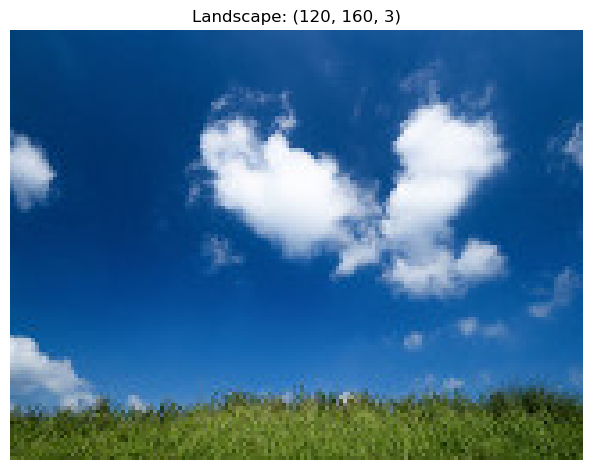

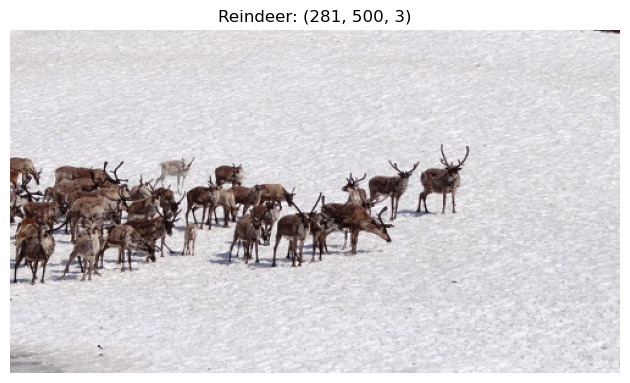

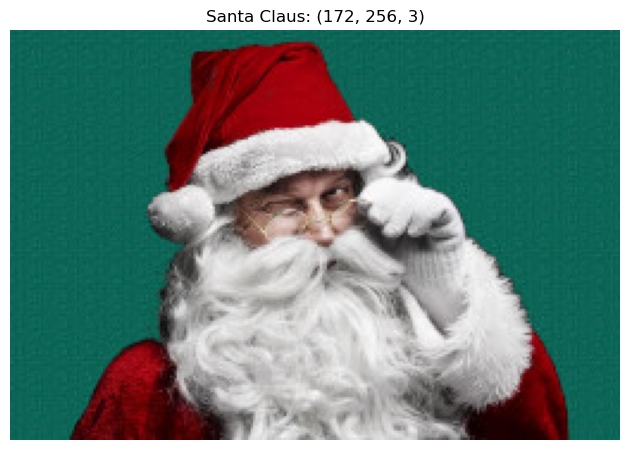

In [8]:
# To load the images use the function plt.imread(<path_to_image>)
# Creating a list of dictionaries in which each dictionary contains the path to the image and its title
images = [{"path": ".\\data\\landscape.jpg", "title": "Landscape"},
          {"path": ".\\data\\reindeer.jpg", "title": "Reindeer"},
          {"path": ".\\data\\santaclaus2.jpg", "title": "Santa Claus"}]

for image in images:
    img = plt.imread(image["path"]) # loads the images
    title = image["title"]
    
# Plot the images with their shapes
# Suggestion: use the function img_plot()
    
    img_plot(img, title)

We are going to start by using the Santa Claus image.


In [9]:
# Reshape the data to a matrix of num_pixels x 3 
# (divide by 255 to have colors in [0 1] range for plotting functions of sklearn)
santaclaus_img = plt.imread(".\\data\\santaclaus2.jpg")
print("Shape of original image: ", santaclaus_img.shape)

num_pixels = santaclaus_img.shape[0] * santaclaus_img.shape[1]
sc_data = np.reshape(santaclaus_img, (num_pixels, 3)) /255. # flattens the image and rescales value of each pixel

# Print the shape of the data and the min and max values of the pixels
print("Shape of data: ", sc_data.shape)
print("Minimum pixel value: ", np.min(sc_data))
print("Maximum pixel value: ", np.max(sc_data))

Shape of original image:  (172, 256, 3)
Shape of data:  (44032, 3)
Minimum pixel value:  0.0
Maximum pixel value:  1.0


Plot the points in the 3-dimensional space with normalized intervals between 0 and 1 (corresponding to the three channels of the image, i.e. Red Green and Blue)

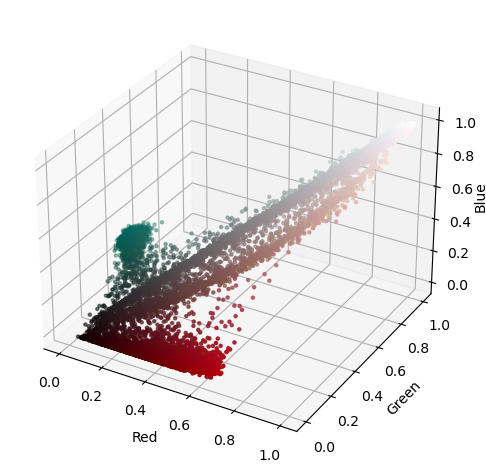

In [10]:
# Suggestion: use the function scatter_plot()
scatter_plot(sc_data)

### TO DO (A.1)
Implement the k-means algorithm manually (**do not use the kmeans function of sklearn and do not download implementations from other web sources**). The inputs to the function is the set of vectors to be clustered and the number of clusters. The output must contain the clusters barycenters, a vector associating each data point to the corresponding cluster and the error (value of the cost function) at each iteration.
Additionally, fix a maximum number of iterations of the k-means algorithm (e.g., 50).

Be careful about the initalization, you can use some random points from the training set, or get random values but ensure they are in the proper range. Poor initalizations can lead to the failure of the algorithm (in particular check that no cluster is initialized as empty, otherwise the algorithm can not update it).

In [11]:
def my_kmeans(points: np.ndarray, k: int, max_iters: int = 50) -> tp.Tuple[np.ndarray, np.ndarray, list]:
    """
    Perform K-means clustering
    :param points: data points
    :param k: number of clusters
    :param max_iters: maximum number of iterations
    """

    # Generate random centers
    # NOTE: Since I have encountered some initialization issues, instead of using the mean and the standard deviation
    # I have decided to use random points from the training set as initial centroids.
    # In this way I am sure that each cluster contains at least one point since the beginning.
    
    centroids = points[np.random.choice(points.shape[0], k, replace=False)]
    
    prev_error = 100000
    error = [9999]

    # Iterate until the estimate of that center stays the same or max iteration are reached
    iters = 0
    while (error[iters] != prev_error) and iters < max_iters:
        
        # Measure the distance to every center
        
        # distances = np.zeros((points.shape[0],k))
        # for i in range(points.shape[0]):
            # for j in range(len(centroids)):
                # d = (np.linalg.norm(points[i,:] - centroids[j,:]))**2
                # distances[i,j] = d
                
        # NOTE: At first, I was using this implementation with nested for loops because it was very straightforward
        # and intuitive to me. However, I am aware that this approach significantly slowed down the algorithm.
        # Therefore, I made the more efficient choice of using broadcasting:
        
        distances = (np.linalg.norm(points[:, np.newaxis, :] - centroids, axis=2)) **2
                
        # Assign all training data to the closest center
        clusters = np.argmin(distances, axis=1)

        # Calculate mean for every cluster and update the center
        new_centroids = np.array([np.mean(points[clusters == j], axis=0) for j in range(k)])
        
        # Update the error
        current_error = np.sum(np.min(distances, axis=1))
        error.append(current_error)
        prev_error = error[iters]
        
        # Update the centroids
        centroids = new_centroids

        # Update the iteration counter
        iters += 1

    return centroids, clusters, error


### TO DO (A.2)

Now try the function you developed on the Santaclaus image with three clusters (k=3). 

Then plot the data points in the 3-dimensional space, each point must be coloured based on the membership to one of the clusters. Additionally, plot the respective clusters centroids (use a different shape, size or color to highlight the centroids).

Error at each iteration:
 [9999, 13874.392510572856, 3252.8966747618097, 1167.3305097161292, 1097.038184493761, 1093.4890272214511, 1092.967591774285, 1092.8920587593213, 1092.8792978369102, 1092.8769044836863, 1092.8766712302174, 1092.876549748246, 1092.876549748246]


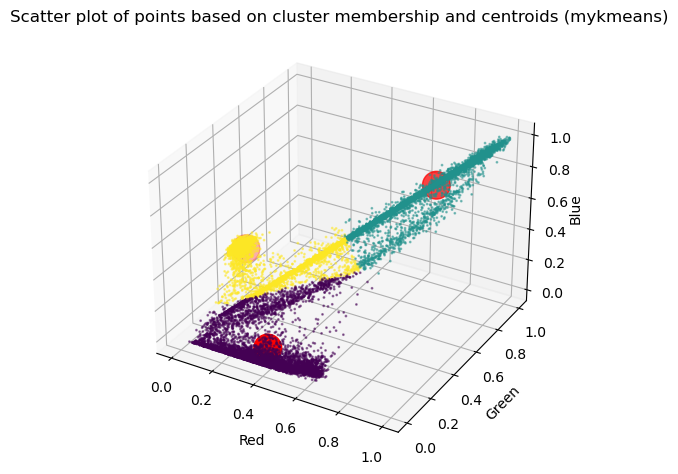

In [12]:
# Run your K-means function on the data
sc_centroids, sc_clusters, sc_error = my_kmeans(sc_data, 3)

# Print the errors:
print("Error at each iteration:\n", sc_error)

# Plot the results
scatter_plot(sc_data, sc_clusters, sc_centroids, "Scatter plot of points based on cluster membership and centroids (mykmeans)")

### TO DO (A.3) 
Plot the value of the error versus the number of iterations.

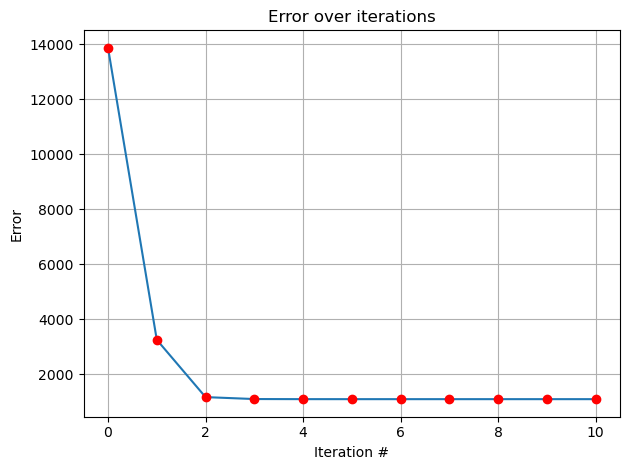

In [13]:
# Suggestion: use the function error_plot()
error_plot(sc_error) 

### TO DO (A.4)
Now use the k-means function provided in sklearn. Pass to the function the number of clusters and use multiple random initializations (n_init parameter). Go to the documentation page for further details.

In [14]:
# Define the K-means model
kmeans = KMeans(n_clusters=3, init='random', n_init='auto', max_iter=100)

# Fit the model to the data
kmeans.fit(sc_data)

# Get the cluster centers
sksc_centers = kmeans.cluster_centers_

Perform the same plot as above but with the output of the k-means function provided in sklearn.

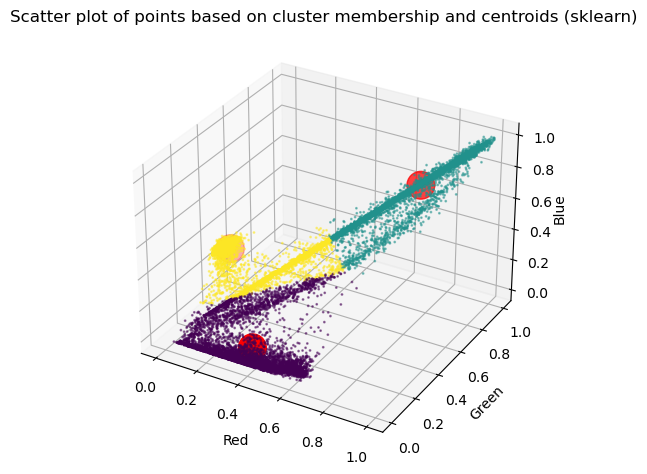

In [15]:
sksc_labels = kmeans.labels_
scatter_plot(sc_data, sksc_labels, sksc_centers, "Scatter plot of points based on cluster membership and centroids (sklearn)")

### TO DO (A.Q1) 

**QUESTION A.Q1**: Compare the results obtained with your implementation and with k-means from sklearn. Do you observe any differences, *i.e.*, do the two plots match?

**ANSWER A.Q1**: The two scatter plots match very well. This means that the manually implemented k-means function yields very similar results to the one from sklearn.

### TO DO (A.5)

Now display the segmented image based on the two clusters found above with the k-means functions by sklearn.

Restored RGB color values of the centers:
 [[100.11273957  13.96794975  17.31873087]
 [198.87515688 196.43388704 195.74913252]
 [ 19.94196392 100.66891836  87.51396326]]


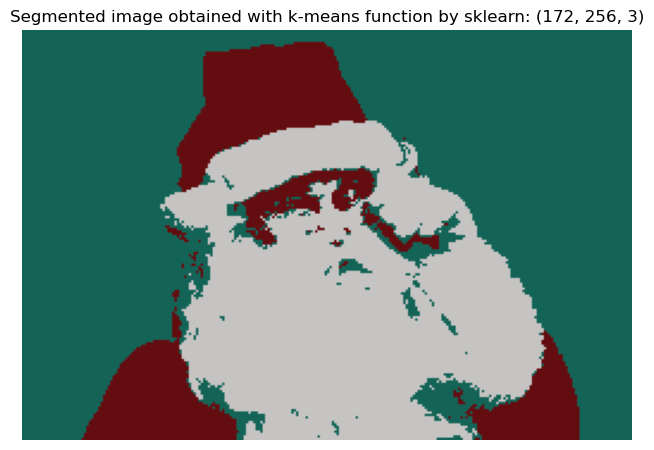

In [16]:
# Extract the color values of the centers
sksc_colors = sksc_centers * 255.
print("Restored RGB color values of the centers:\n", sksc_colors)

# Reshape the data to the original image shape
segmented_image = sksc_centers[sksc_labels].reshape(santaclaus_img.shape)
# this line assigns to each point of the data the color of the center of the cluster it belongs to
# and reshapes the data in the original form of the image

# Plot the recolored image
img_plot(segmented_image, 'Segmented image obtained with k-means function by sklearn')

Now display the segmented image based on the two clusters found above with the k-means functions implemented by yourselves.

Restored RGB color values of the centers:
 [[100.11978661  13.73488522  17.11445199]
 [198.89534712 196.46277696 195.78042836]
 [ 20.04159467 100.6497984   87.50436106]]


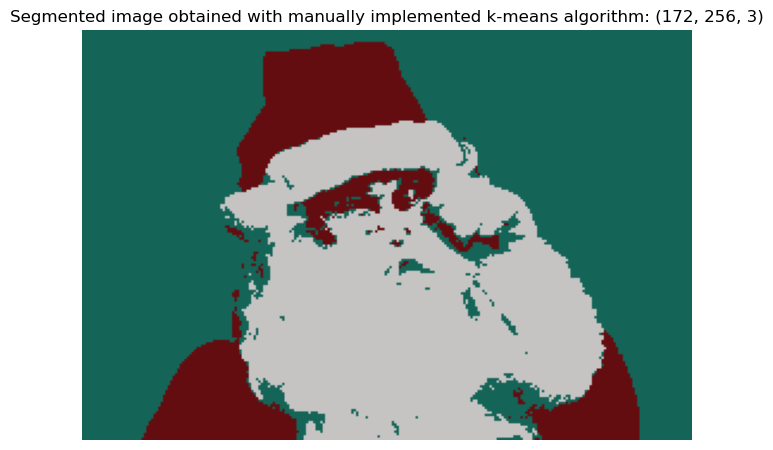

In [17]:
# Extract the color values of the centers
sc_colors = sc_centroids * 255.
print("Restored RGB color values of the centers:\n", sc_colors)

# Reshape the data to the original image shape
sc_segmented_image = sc_centroids[sc_clusters].reshape(santaclaus_img.shape)

# Plot the recolored image
img_plot(sc_segmented_image, 'Segmented image obtained with manually implemented k-means algorithm')

### TO DO (A.Q2)

**QUESTION A.Q2**: What do you observe? Do you think clustering is useful for image segmentation? And for image compression? Comment your answer.

**ANSWER A.Q2:** First of all, I observe that the two segmented images obtained with the manually implemented my_kmeans and with the KMeans function from sklearn are nearly identical: this confirms that indeed the two functions perform equally well.

Secondly I notice that, even with three clusters only, the subject of the segmented picture is clearly recognizable. This makes me think that clustering is a very powerful tool for image segmentation: this algorithm partitions the image in such a way that it is possible to identify objects, particular features or different regions within the image itself. 

For what concerns image compression, clustering can be useful as well: the algorithm reprocesses the image recoloring it with as many colors as the number of clusters. In this way, the color space and therefore the size in bytes of the image are reduced. However, this is a lossy compression, in the sense that while the file size is significantly reduced, the image quality is reduced as well. Depending on the type of image considered, an appropriate number of clusters (possibly very high) can be found in order to perform a good enough compression without reaching image degradation.

### TO DO (A.6)

Now load the landscape image (optional: try also with the reindeer image) and segment it using kmeans with k varying from 2 to 15 clusters. You can use the sklearn implementation.

Then plot the resulting data points in the 3-dimensional space, each point must be colored based on the cluster membership.

Shape of original image:  (120, 160, 3)
Shape of data:  (19200, 3)
Minimum pixel value:  0.0
Maximum pixel value:  1.0

K-means clustering with different values of K (2-15):

Restored color values of the 2 centers:
 [[188.19978324 203.15317919 223.91112717]
 [ 29.9871592   85.50006086 128.49105404]]


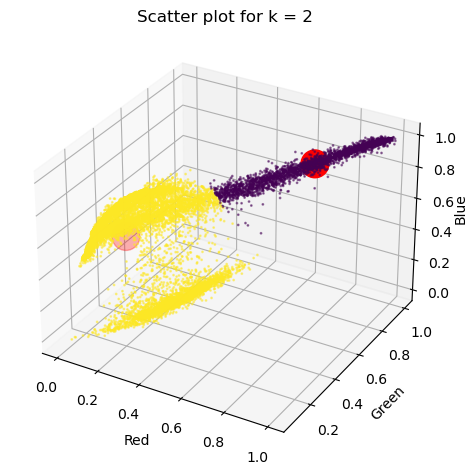

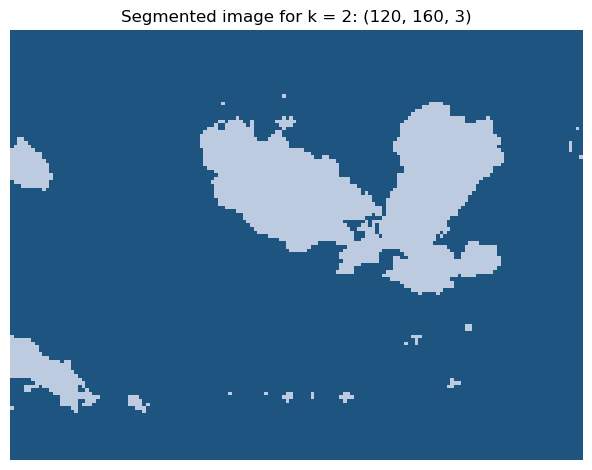


Restored color values of the 3 centers:
 [[ 20.78186416  83.00534682 145.4458815 ]
 [187.98811239 202.96829971 223.76008646]
 [ 79.02863777  98.69620743  37.54721362]]


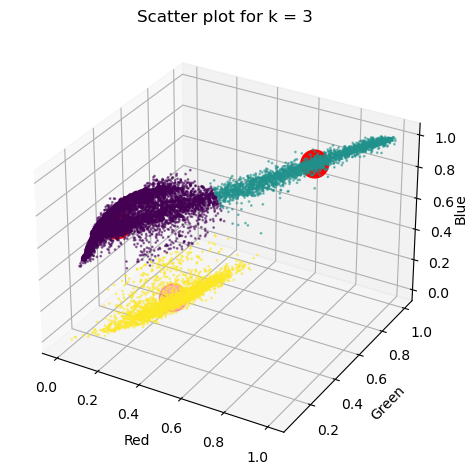

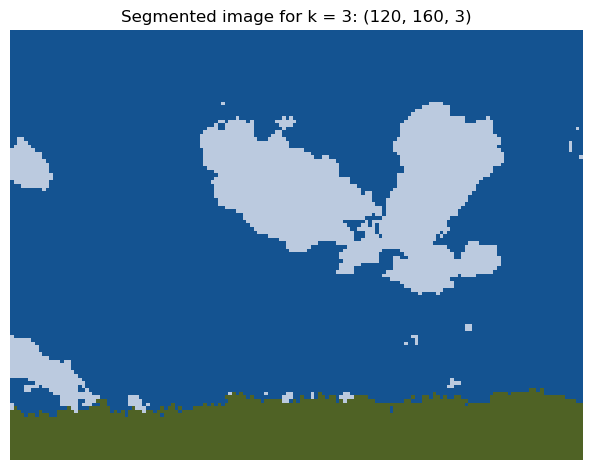


Restored color values of the 4 centers:
 [[ 10.06109417  73.13696149 136.49885627]
 [200.45271716 212.6534018  230.20881472]
 [ 78.86790987  98.57731158  37.21484071]
 [ 62.32841717 118.30471425 175.19515407]]


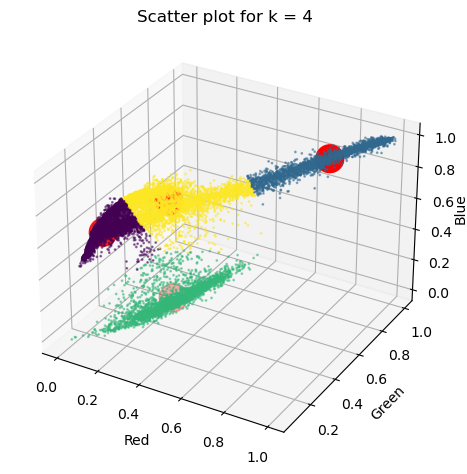

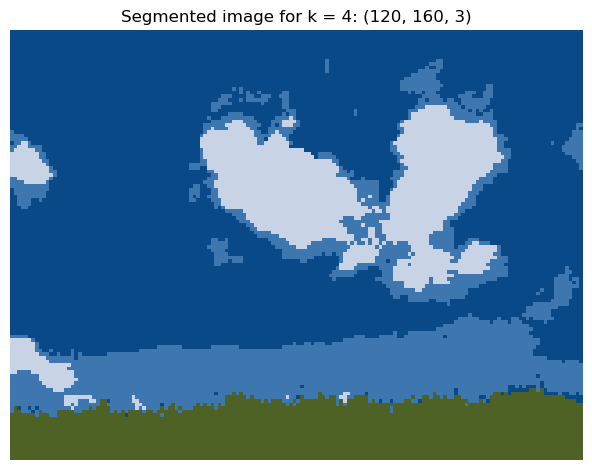


Restored color values of the 5 centers:
 [[  8.29303591  70.30184984 133.01523395]
 [ 42.64261479 106.64532911 169.4272789 ]
 [ 78.9623301   98.64932039  37.28194175]
 [218.75060533 227.03087167 239.64346247]
 [135.27606461 161.99339207 196.63069016]]


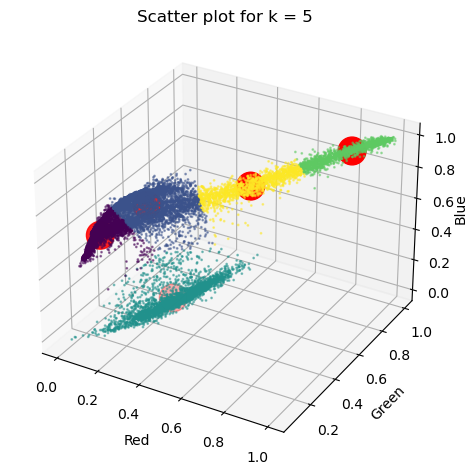

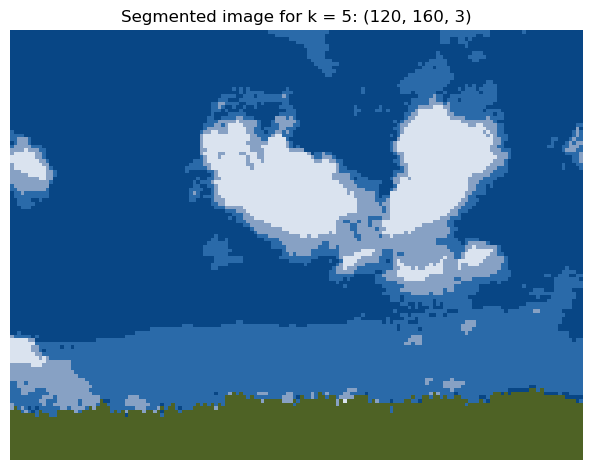


Restored color values of the 6 centers:
 [[ 58.23443983 115.99239281 174.21196404]
 [221.92125984 229.49934383 241.31824147]
 [  3.84569786  63.20423927 123.72696246]
 [ 18.1973269   85.71635419 152.27399295]
 [146.40966719 170.41442155 202.14263074]
 [ 78.99415888  98.66939252  37.13746106]]


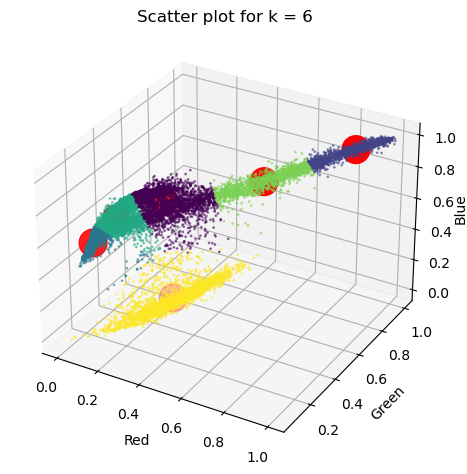

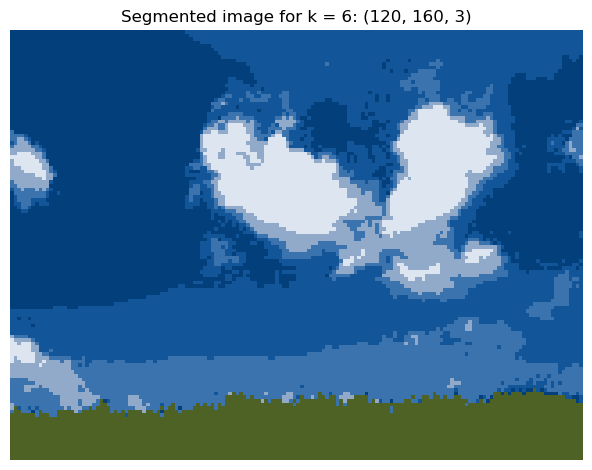


Restored color values of the 7 centers:
 [[221.92125984 229.49934383 241.31824147]
 [146.4409199  170.43854084 202.1593973 ]
 [ 96.09192825 115.67189836  50.93423019]
 [ 58.21463415 116.04494774 174.45888502]
 [  3.86822262  63.22459605 123.74901257]
 [ 18.21116055  85.75862069 152.34074898]
 [ 60.65325825  80.46983105  23.01206758]]


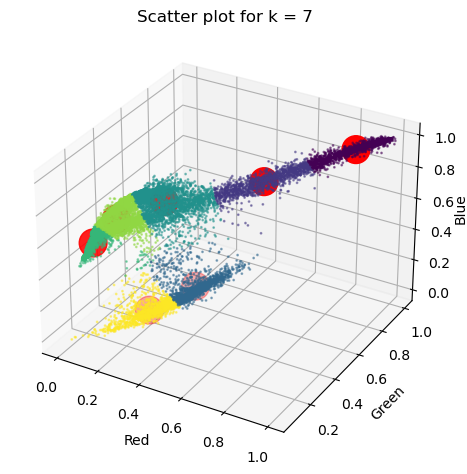

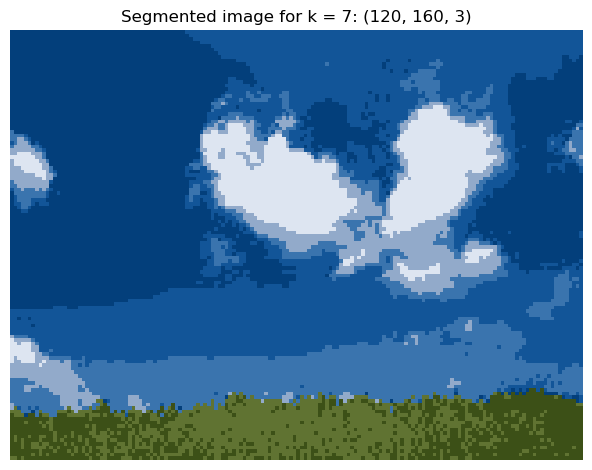


Restored color values of the 8 centers:
 [[ 60.60048426  80.40839387  22.9677159 ]
 [ 95.95603577 115.58345753  50.87704918]
 [ 42.80469036 108.75778674 173.05276658]
 [227.89992181 234.23690383 244.39640344]
 [  3.21234007  61.70284771 121.69376806]
 [ 97.67881356 135.40423729 178.95932203]
 [165.69092543 185.26504942 212.15543576]
 [ 15.7691886   82.44663743 148.49122807]]


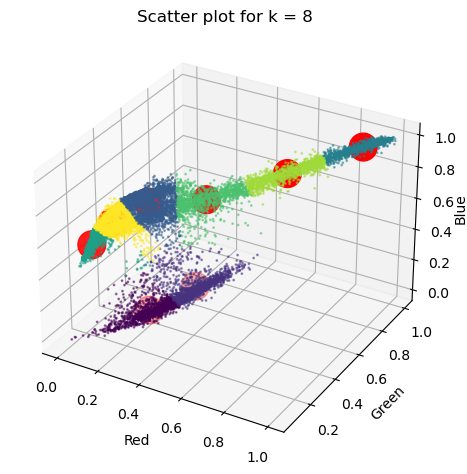

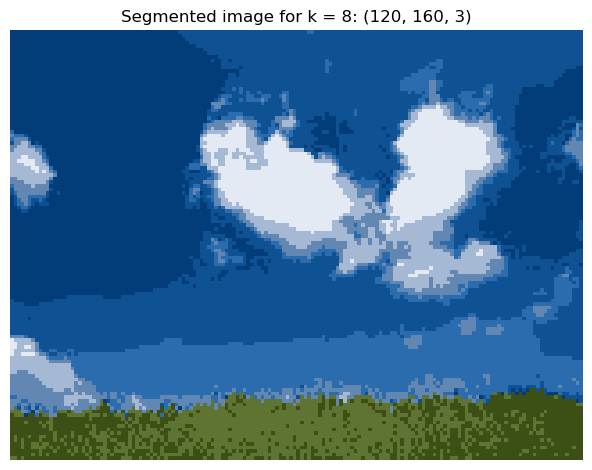


Restored color values of the 9 centers:
 [[ 60.58434221  80.39790153  23.00161421]
 [ 14.44984508  80.20701007 145.62761425]
 [130.75923719 158.30035757 193.96066746]
 [ 31.90541571 102.91838291 170.70823799]
 [231.65329768 237.13636364 246.1684492 ]
 [ 96.11636637 115.65165165  50.38663664]
 [  3.01359483  60.90639626 120.59928683]
 [ 72.85639344 121.44918033 172.92918033]
 [181.68965517 197.9137931  220.84942529]]


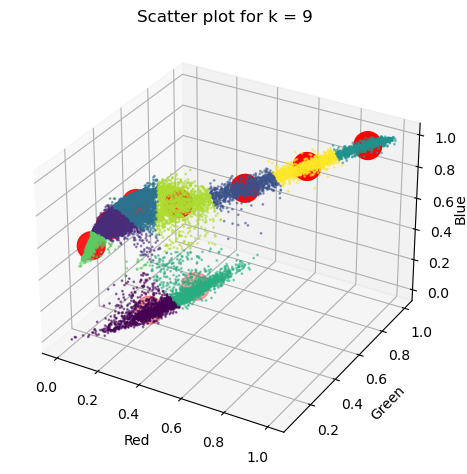

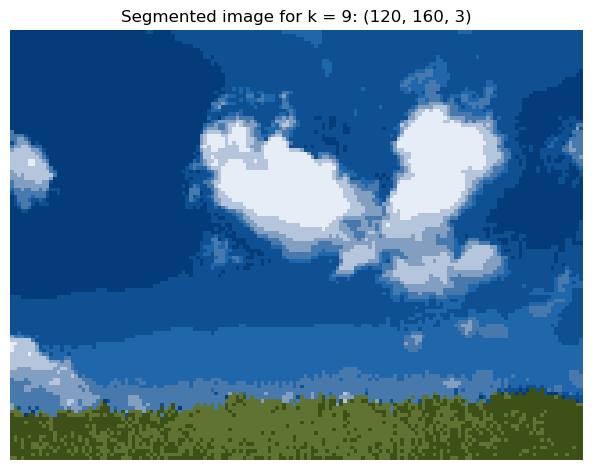


Restored color values of the 10 centers:
 [[137.76470588 163.63602941 197.62622549]
 [ 60.65372168  80.44174757  22.88915858]
 [ 84.02826855 126.42932862 173.09187279]
 [ 96.04797601 115.63043478  50.47301349]
 [ 20.08070075  88.15852958 154.97587593]
 [  8.18525799  72.92776413 136.83562654]
 [186.58809524 201.85833333 223.45595238]
 [ 41.83442164 109.44916045 175.13852612]
 [  2.66074313  57.63812601 116.01647819]
 [233.26070409 238.39105614 246.91531874]]


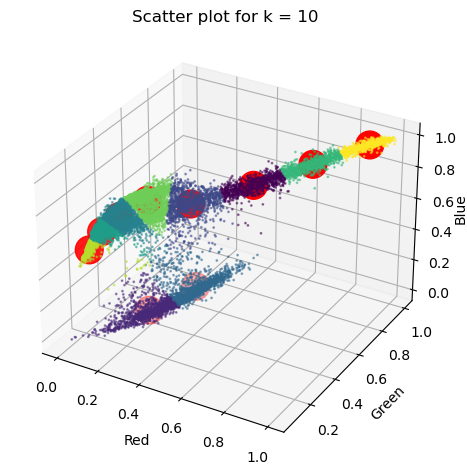

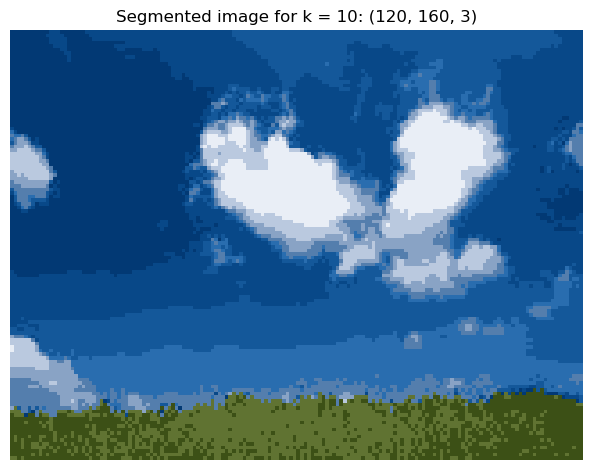


Restored color values of the 11 centers:
 [[ 20.05630566  88.17925883 155.06118931]
 [186.61501788 201.88319428 223.47318236]
 [103.04820766 122.18170581  58.53399258]
 [ 79.04793864  99.37488015  34.74209012]
 [ 41.93837535 109.48272642 175.13772176]
 [233.26070409 238.39105614 246.91531874]
 [ 84.08985765 126.56405694 173.35498221]
 [  8.1997546   72.93717791 136.84196319]
 [  2.66074313  57.63812601 116.01647819]
 [137.8370098  163.67769608 197.64338235]
 [ 52.21655172  71.65655172  17.67724138]]


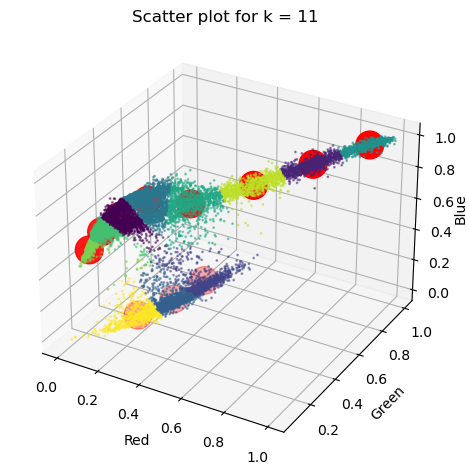

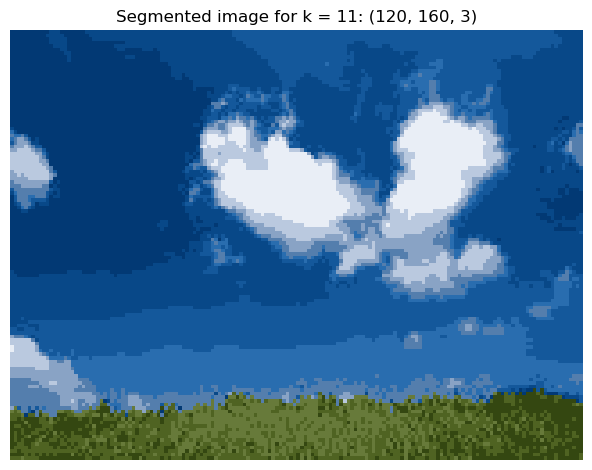


Restored color values of the 12 centers:
 [[138.23797781 163.98766954 197.85819975]
 [ 19.75391304  88.10637681 155.34347826]
 [186.76196172 201.99401914 223.54904306]
 [ 51.18611521  70.51846381  17.45790251]
 [  8.02414983  72.86347955 136.97585017]
 [ 84.43438078 127.487061   175.69038817]
 [105.43548387 124.12768817  53.31182796]
 [ 41.94153414 109.45416277 175.19223573]
 [ 78.77321603  98.85532747  32.23949169]
 [ 69.5         99.46062992 102.89370079]
 [  2.41111472  57.51966201 116.18102047]
 [233.28190476 238.41047619 246.92571429]]


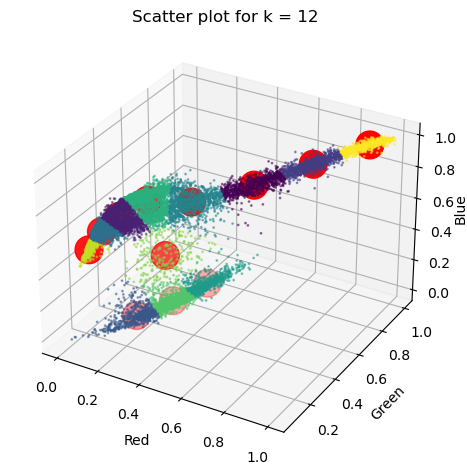

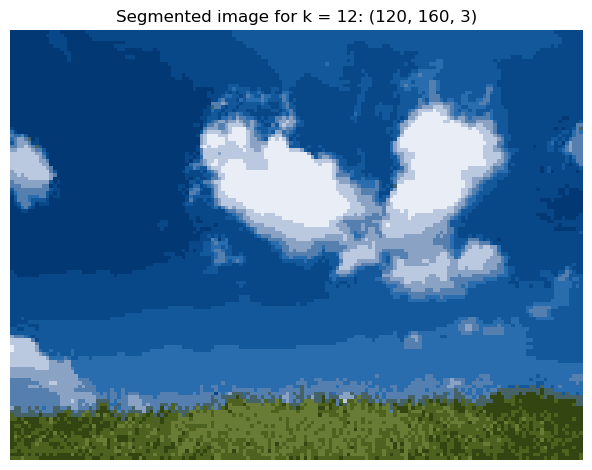


Restored color values of the 13 centers:
 [[ 88.21590909 129.64256198 176.67045455]
 [103.94278607 122.69651741  56.25497512]
 [ 51.375       70.72794118  17.18529412]
 [ 41.83776933 112.79214195 180.36375158]
 [ 16.32804533  93.35637394 164.78356941]
 [ 78.1299435   98.43691149  34.19303202]
 [ 18.23015609  81.29790767 145.79840585]
 [233.28190476 238.41047619 246.92571429]
 [  2.48330206  56.58536585 114.53058161]
 [187.02539299 202.18742443 223.69649335]
 [139.52223634 164.98856417 198.5501906 ]
 [  5.00627353  69.7183187  133.34033877]
 [ 55.3202454  101.21717791 149.21349693]]


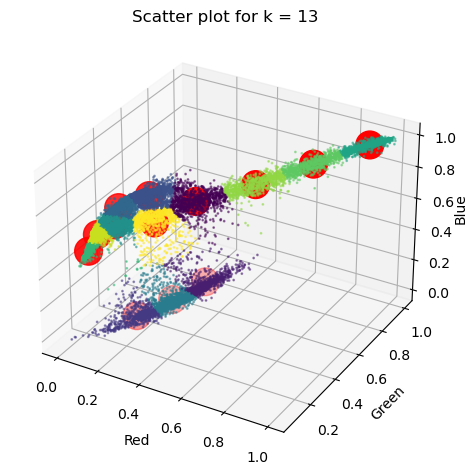

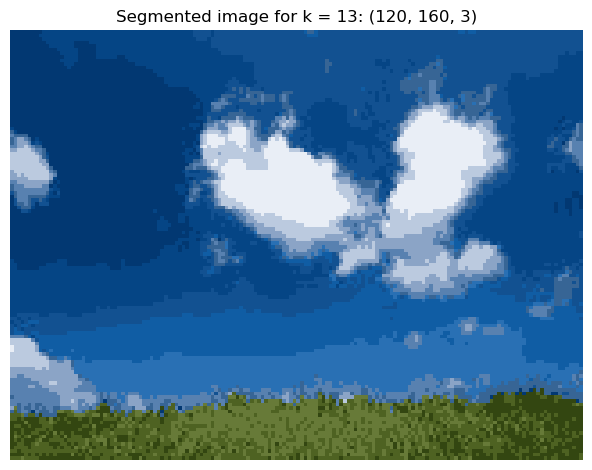


Restored color values of the 14 centers:
 [[234.83844581 239.59100204 247.64110429]
 [104.38303342 123.08997429  57.07712082]
 [ 17.36495868  80.82347107 145.49719008]
 [ 39.685222   111.65606362 179.84095427]
 [  4.85558408  69.3796534  132.87002567]
 [194.79741379 208.32758621 227.7341954 ]
 [ 79.10305344  99.36450382  34.89122137]
 [ 16.00978699  92.96257916 164.37708693]
 [  2.43960245  56.45527523 114.37652905]
 [156.06635802 177.80555556 207.39814815]
 [ 51.51969504  98.49301144 147.55527319]
 [118.01543739 148.6329331  187.4373928 ]
 [ 52.21655172  71.65655172  17.67724138]
 [ 77.83333333 124.0932914  174.64046122]]


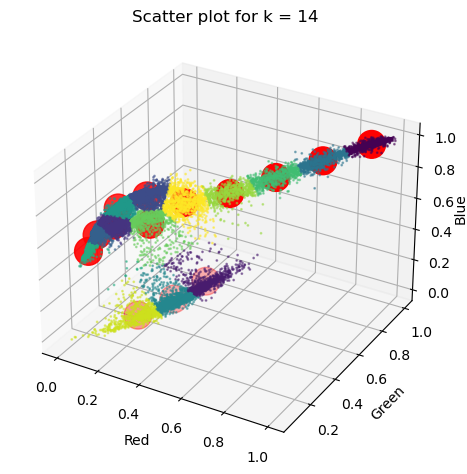

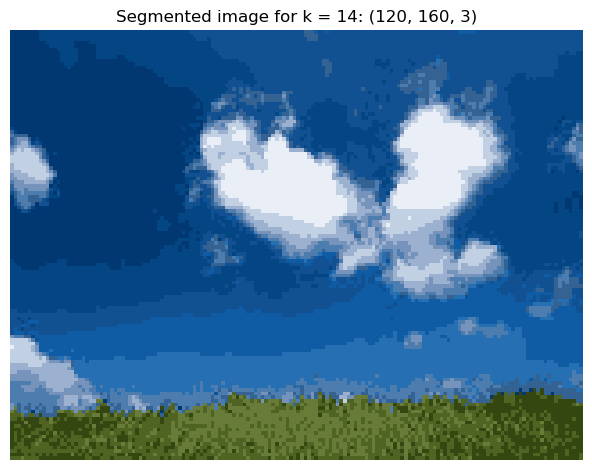


Restored color values of the 15 centers:
 [[  2.20146185  55.3718593  112.96710827]
 [  3.640625    66.62382812 128.89296875]
 [105.98321678 124.63776224  53.45034965]
 [ 70.7787234   97.42978723  92.84680851]
 [233.49279539 238.56292027 247.00192123]
 [ 94.13186813 133.74603175 179.63492063]
 [ 52.24825662  71.58019526  17.35564854]
 [ 15.26571429  92.716      164.43428571]
 [142.5126162  167.21115538 200.05577689]
 [ 10.55147326  76.5638414  142.37759185]
 [ 40.4031725  112.65366821 180.9828156 ]
 [ 62.62653563 109.56511057 161.25921376]
 [188.16521739 203.09068323 224.29565217]
 [ 79.90723751  99.95616718  32.3312946 ]
 [ 28.55099423  86.25336754 147.53367543]]


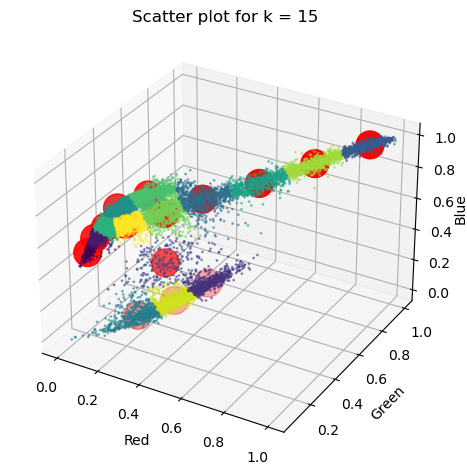

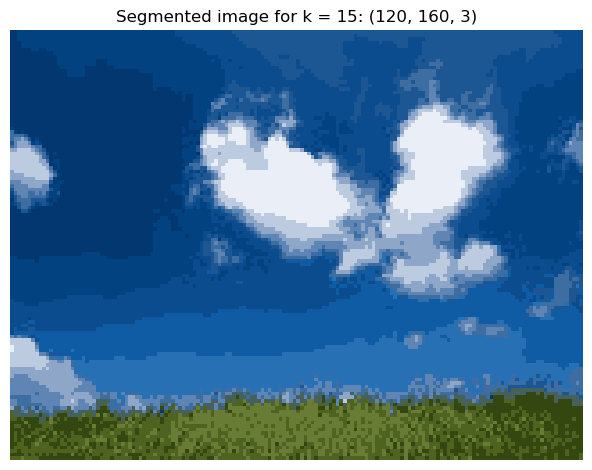

In [18]:
# Reshape the data to a matrix of total_num_pixels x 3
landscape_img = plt.imread(".\\data\\landscape.jpg")
print("Shape of original image: ", landscape_img.shape)

num_pixels = landscape_img.shape[0] * landscape_img.shape[1]
land_data = np.reshape(landscape_img, (num_pixels, 3)) /255. # flattens the image and rescales value of each pixel

# Print the shape of the data and the min and max values of the pixels
print("Shape of data: ", land_data.shape)
print("Minimum pixel value: ", np.min(land_data))
print("Maximum pixel value: ", np.max(land_data))

# Cycle over different values of K and plot the results for each value
print('\nK-means clustering with different values of K (2-15):')
inertia = list()
for k in range(2,16):
    # Define the K-means model
    kmeans = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100,)

    # Fit the model to the data
    kmeans.fit(land_data)

    # Get the cluster centers
    land_centers = kmeans.cluster_centers_

    # Extract the color values of the centers
    land_colors = land_centers * 255.
    print(f"\nRestored color values of the {k} centers:\n", land_colors)

    # Reshape the data to the original image shape
    land_labels = kmeans.labels_
    land_segmented_image = land_centers[land_labels].reshape(landscape_img.shape)

    # Update the inertia
    current_inertia = kmeans.inertia_
    inertia.append(current_inertia)
    
    # Plot the scatter plot and the recolored image
    scatter_plot(land_data, land_labels, land_centers, f'Scatter plot for k = {k}')

    # Plot the recolored image
    img_plot(land_segmented_image, f'Segmented image for k = {k}')

### TO DO (A.7)

Plot for different values of k (e.g. k between 2 and 15) the respective error of the kmeans algorithm.

k = 2        error = 1043.6728748120108
k = 3        error = 532.0014591836147
k = 4        error = 307.2270682721975
k = 5        error = 217.4512471009392
k = 6        error = 167.53758978709223
k = 7        error = 135.4199613117362
k = 8        error = 109.45961316038016
k = 9        error = 94.29468767466301
k = 10        error = 82.7309607371698
k = 11        error = 74.80250032590264
k = 12        error = 67.36858971925277
k = 13        error = 61.60264822646354
k = 14        error = 55.878886484707245
k = 15        error = 51.67639020170188


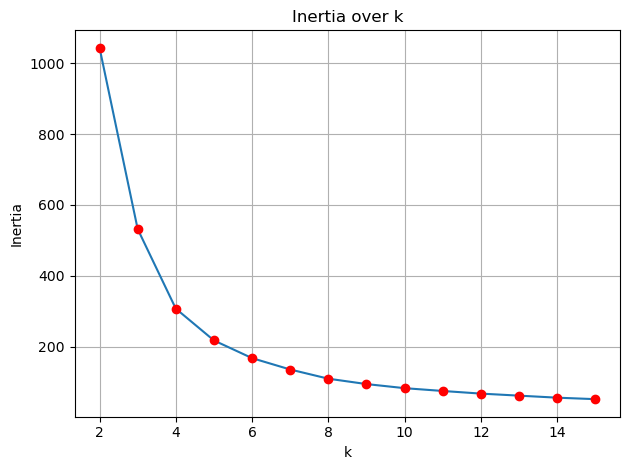

In [19]:
for k in range(2,16):
    print(f"k = {k}" ,"      ", "error =", inertia[k-2])

# I make use of the provided template for error_plot to define inertia_plot:
def inertia_plot(inertia: np.ndarray, labels: np.ndarray = None) -> None:
    """
    Plot the inertia over k
    :param inertia: inertia to plot
    """
    
    if labels is None:
        plt.plot(inertia[1:-1])
        plt.plot(inertia[1:-1], 'ro')
    else:
        plt.plot(labels, inertia)
        plt.plot(labels, inertia, 'ro')
    plt.title('Inertia over k')
    plt.ylabel('Inertia')
    plt.xlabel('k')
    plt.grid()
    plt.tight_layout()
    plt.show()
    plt.close()

inertia_plot(inertia, labels=range(2,16,1))

### TO DO (AQ.3)

**QUESTION AQ.3**: Compare the results with different values of k, what do you observe? 
Analyze also the error, which one do you think is the optimal value of k?
Is there a single, clear answer?

**ANSWER A.Q3:** As k starts to increase, the quality of the image increases very rapidly at the beginning. Then, as soon as  k=7 is reached, not only the obtained result seems reasonably good, but I notice that further increasing the number of clusters does not bring significant improvements.

Looking at the error evolution as k increases, it can be seen that the error goes down exponentially. This explains the observation of image quality improving exponentially fast at the beginning: as long as the number of clusters is very small, adding one can make the difference. Based on the error plot only, one sees that k=7 does not correspond to the minimum error; instead, one would be tempted to say that the higher the number of clusters, the better. This could be true from a mathematical point of view, but since the error decrease rate becomes smaller and smaller, this in practice does not impact on the produced image.

In conclusion there is no single clear answer, it is all a matter of finding the best trade-off. It also came to my mind that maybe if one is interested in doing image segmentation k=3 could even be enough, whereas for the purpose of image compression having a higher number of clusters could help in avoiding degrading the image too much.

## Reindeer image

Shape of original image:  (281, 500, 3)
Shape of data:  (140500, 3)
Minimum pixel value:  0.0
Maximum pixel value:  1.0

K-means clustering with different values of K (2-15):

Restored color values of the 2 centers:
 [[220.92770646 218.53524887 222.50434797]
 [ 88.94241365  71.02446827  69.02221696]]


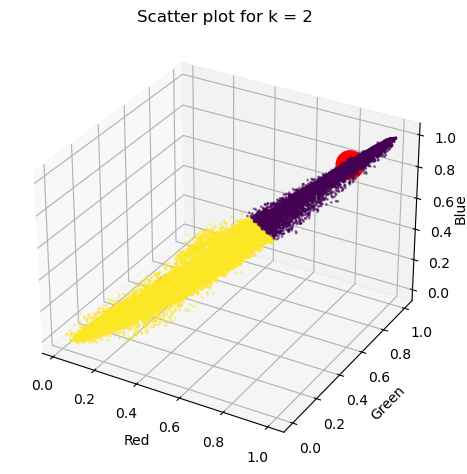

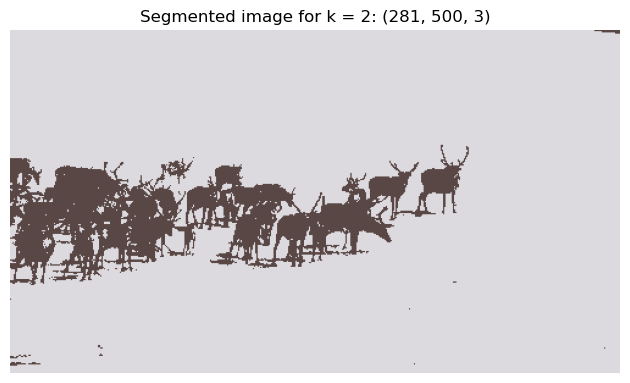


Restored color values of the 3 centers:
 [[ 67.46449704  48.17372411  45.75952293]
 [221.73378229 219.45381678 223.47497228]
 [136.81689607 122.68304079 121.84253062]]


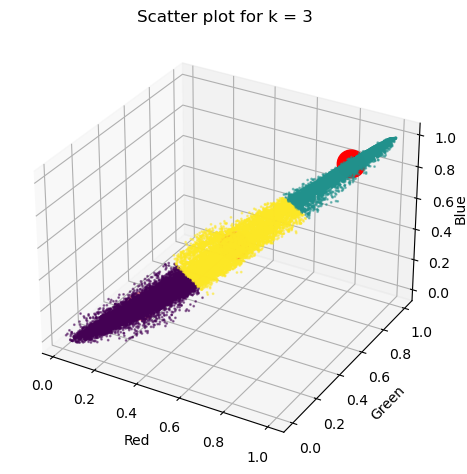

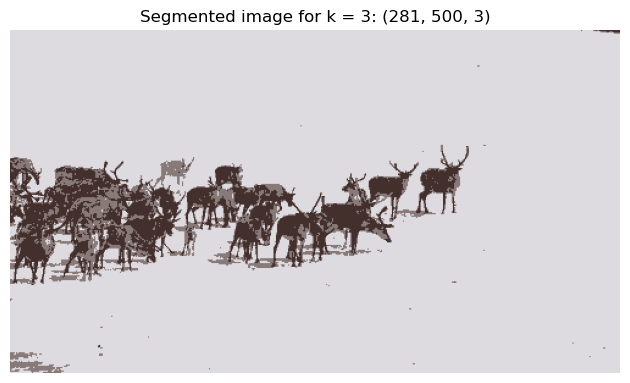


Restored color values of the 4 centers:
 [[212.77269516 210.19592017 213.90088308]
 [ 65.90078102  46.64911773  44.31433806]
 [132.12653689 117.24141906 116.06326844]
 [229.07219068 226.99587525 231.26530799]]


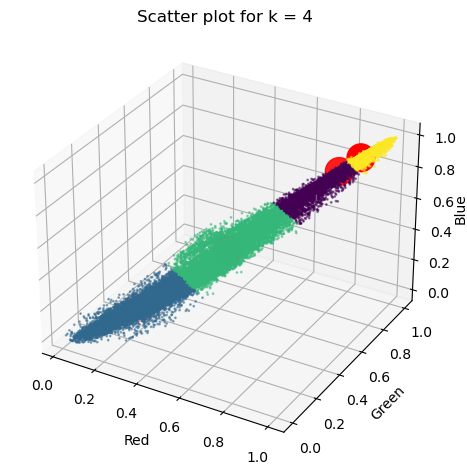

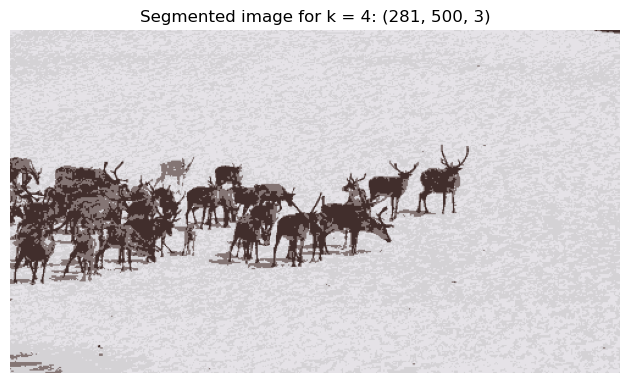


Restored color values of the 5 centers:
 [[156.89233692 145.81275069 146.12180705]
 [ 56.49426187  37.73330725  35.89358372]
 [213.50205013 211.02763219 214.76450244]
 [229.1338347  227.05953496 231.3439337 ]
 [106.74364592  88.06105755  85.24846626]]


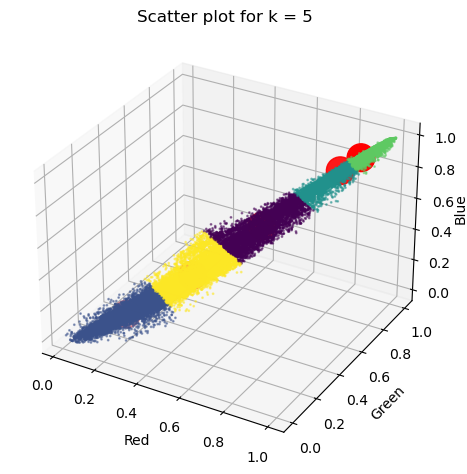

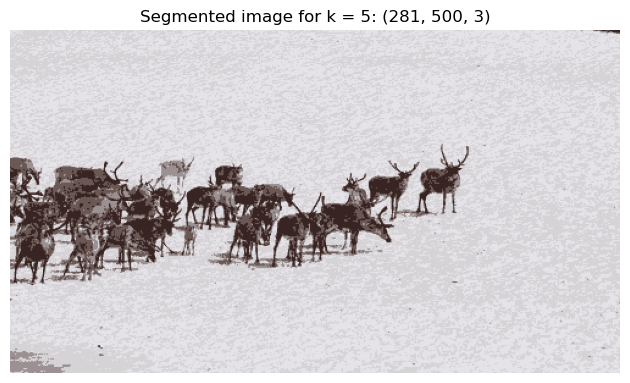


Restored color values of the 6 centers:
 [[221.4510765  219.27649181 223.31047702]
 [208.09834868 205.30965951 208.88564957]
 [233.93130759 231.9010139  236.28484699]
 [ 56.0916071   37.36351602  35.55890919]
 [105.32035478  86.36831028  83.36500301]
 [152.84264832 141.23344798 141.43981083]]


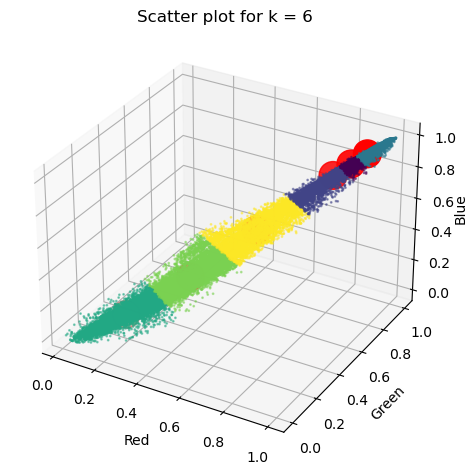

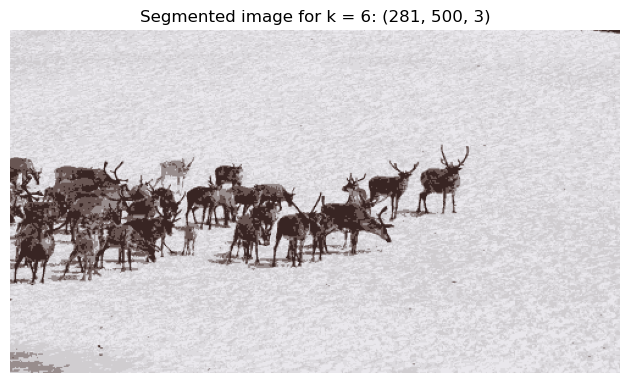


Restored color values of the 7 centers:
 [[234.46517095 232.43564855 236.76761604]
 [209.94320149 207.33298719 210.94622235]
 [ 50.67132867  32.41824842  30.95337995]
 [ 91.27386486  70.73471577  67.04790847]
 [170.27078454 160.88905152 161.56733021]
 [127.11170326 112.06118098 111.20571307]
 [222.26482107 220.11012829 224.23202228]]


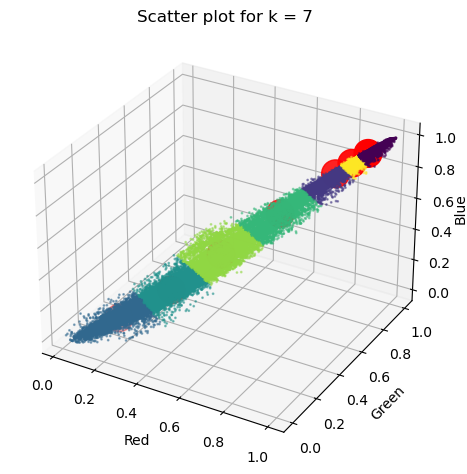

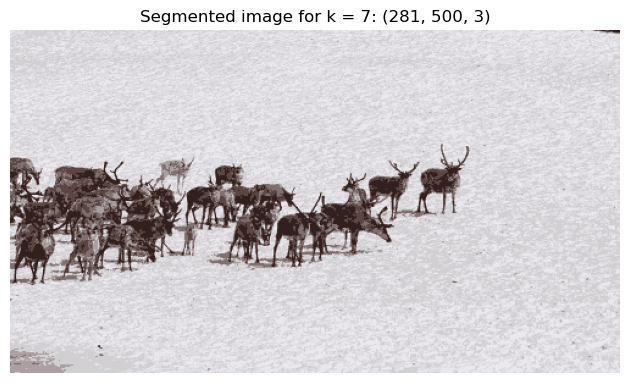


Restored color values of the 8 centers:
 [[237.63501555 235.62449175 239.99198756]
 [217.90409173 215.67732314 219.68127789]
 [167.62858004 157.76213446 158.2463069 ]
 [ 50.27362171  32.07090755  30.62968617]
 [227.05200295 224.95819612 229.16279184]
 [125.82394669 110.57373173 109.6416595 ]
 [ 90.41723519  69.8454219   66.18114901]
 [206.38879826 203.50543774 206.93936922]]


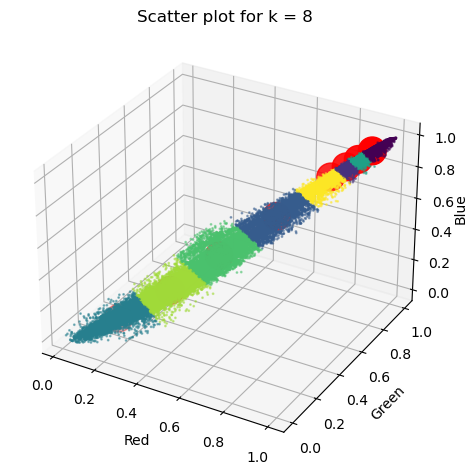

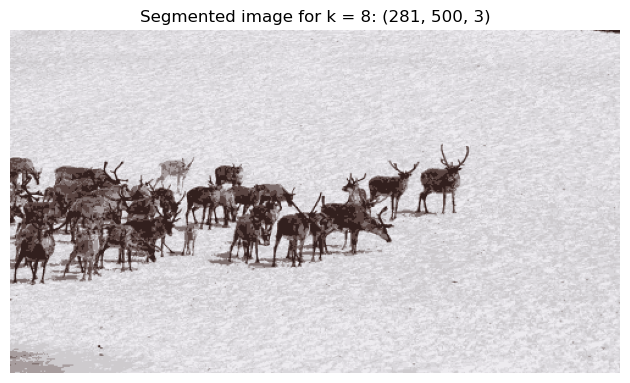


Restored color values of the 9 centers:
 [[217.90420525 215.67871743 219.68324752]
 [ 78.47765599  57.86024452  54.68254637]
 [109.22909263  90.39042881  87.18739635]
 [174.32278706 165.65232847 166.62460007]
 [227.05200295 224.95819612 229.16279184]
 [237.63501555 235.62449175 239.99198756]
 [ 45.4308801   27.87071413  26.76960035]
 [206.68623224 203.85607694 207.31813409]
 [138.18031333 124.78007685 124.71711499]]


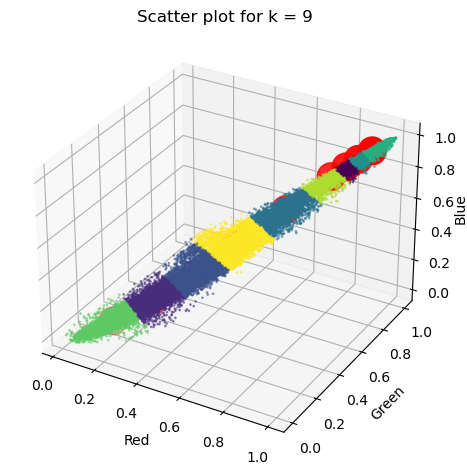

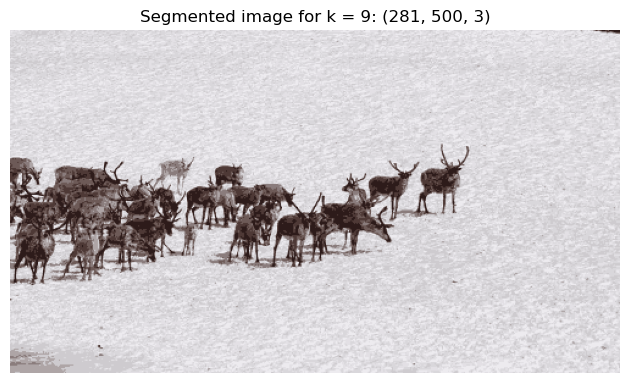


Restored color values of the 10 centers:
 [[108.77793904  89.79487179  86.47508466]
 [ 45.40892193  27.85195714  26.75071069]
 [239.4628092  237.47224893 241.94240014]
 [214.93422652 212.63144322 216.47224116]
 [203.90255522 200.7728887  204.07864877]
 [ 78.35028608  57.73532528  54.56410256]
 [222.73271595 220.59441695 224.75975305]
 [136.84040344 123.39513497 123.4120439 ]
 [172.30718475 163.23313783 164.04068915]
 [230.1607183  228.0941741  232.3276224 ]]


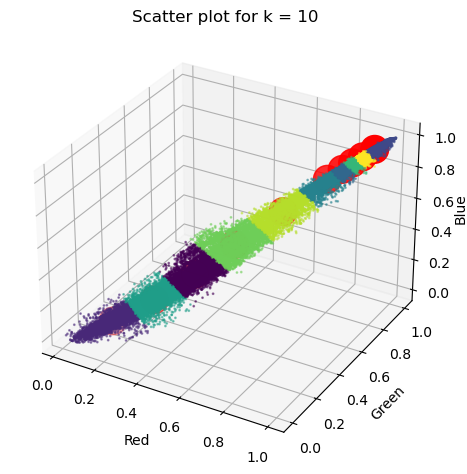

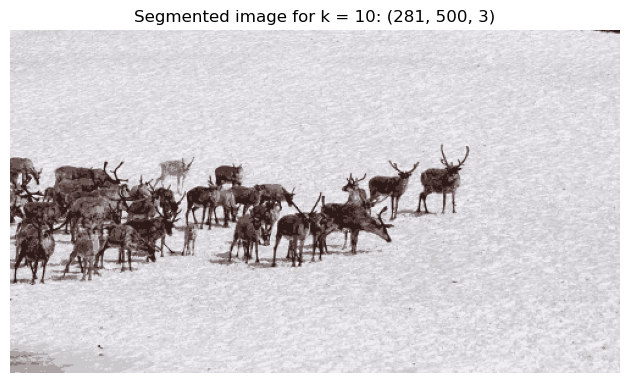


Restored color values of the 11 centers:
 [[205.38592007 202.46081165 205.85339219]
 [215.2440935  212.95337717 216.80794035]
 [ 42.89313173  25.63095848  24.66606868]
 [229.41742098 227.35154454 231.63811063]
 [ 72.55797933  52.19265212  49.33869116]
 [222.44057627 220.2936692  224.3932112 ]
 [152.77777778 140.65121136 140.31119465]
 [124.39241275 109.40758725 108.91107739]
 [181.38945578 173.96471088 175.49957483]
 [100.83858268  80.51207349  76.57007874]
 [238.72070386 236.72354923 241.20329465]]


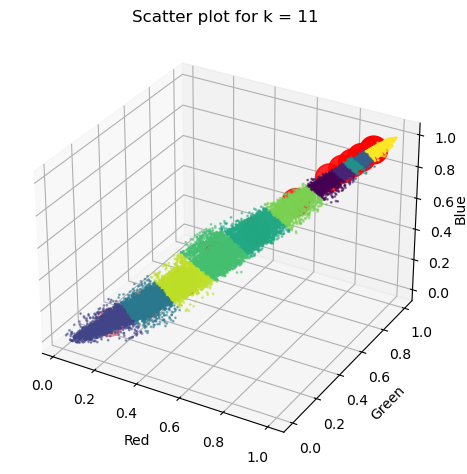

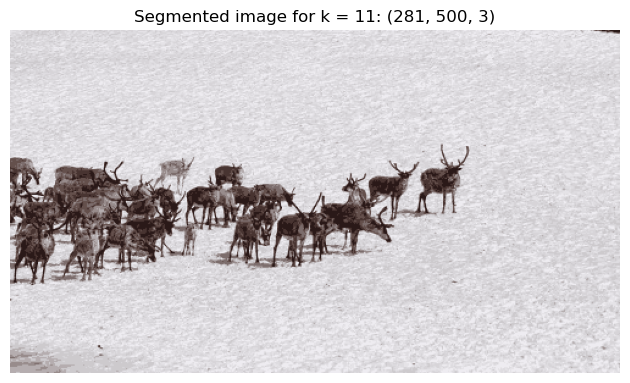


Restored color values of the 12 centers:
 [[121.60346399 106.09176542 105.26405348]
 [ 98.51927195  77.97885439  74.0251606 ]
 [177.44245859 169.38709677 170.64472537]
 [220.38070706 218.21436945 222.32980627]
 [241.14989812 239.16518085 243.67880795]
 [ 71.16004785  50.84904306  48.065311  ]
 [203.336274   200.16917488 203.46123508]
 [148.90199268 136.15778772 135.60837739]
 [ 42.40714286  25.22380952  24.29312169]
 [226.5656069  224.45587968 228.58825886]
 [213.4479936  211.1007386  214.87980659]
 [232.84742003 230.81438244 235.17376839]]


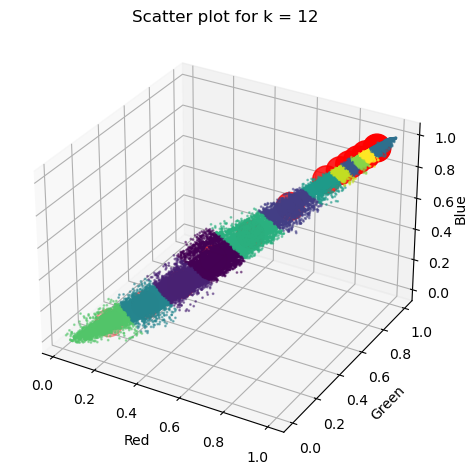

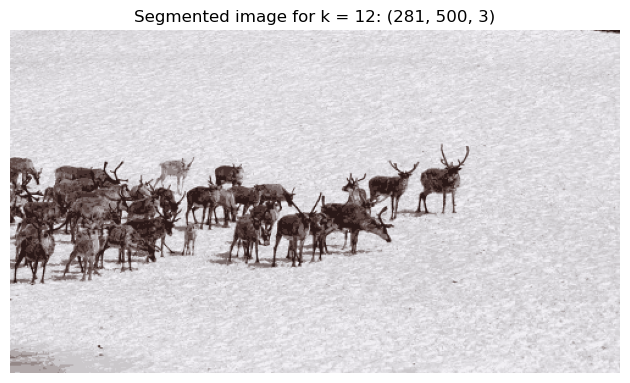


Restored color values of the 13 centers:
 [[120.08854167 104.06403186 102.82567402]
 [174.3520362  165.73755656 166.83755656]
 [241.14989812 239.16518085 243.67880795]
 [ 97.17799618  76.59049959  72.65765766]
 [222.4547976  220.3123367  224.41074084]
 [210.17609645 207.72943974 211.48006194]
 [ 42.11794872  24.96842105  24.06045884]
 [146.05903614 133.1939759  132.80361446]
 [217.1576214  214.89854212 218.76607189]
 [227.30048845 225.20890475 229.43255683]
 [232.90327203 230.87341772 235.26146406]
 [ 70.41378471  50.13321968  47.38602046]
 [199.52140818 195.70637488 198.67706946]]


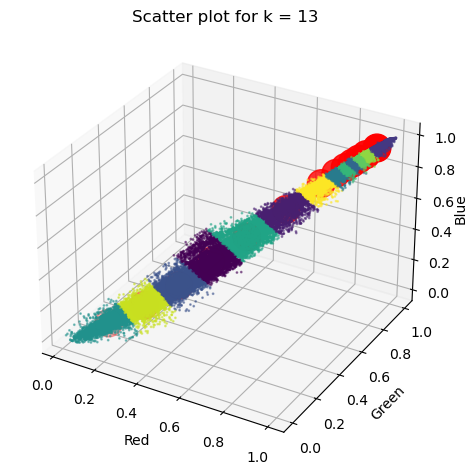

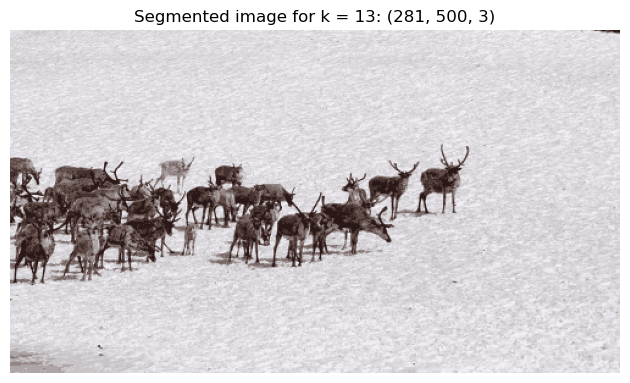


Restored color values of the 14 centers:
 [[ 40.08634223  23.16609105  22.35635793]
 [ 89.93762994  69.27977428  65.61182061]
 [240.35997871 238.37754125 242.87482704]
 [157.08147773 145.20647773 144.70394737]
 [ 65.79575597  45.82175066  43.39098143]
 [231.95299872 229.91365376 234.29359847]
 [112.0813143   93.45370063  90.21805509]
 [221.49102132 219.3377425  223.40728716]
 [131.48212898 117.88150738 118.28088578]
 [226.34807684 224.23911983 228.42864114]
 [210.17762607 207.69536936 211.28685516]
 [216.36447613 214.10916146 218.04462629]
 [180.29486501 172.74801482 174.23239809]
 [200.94688739 197.43886877 200.5792378 ]]


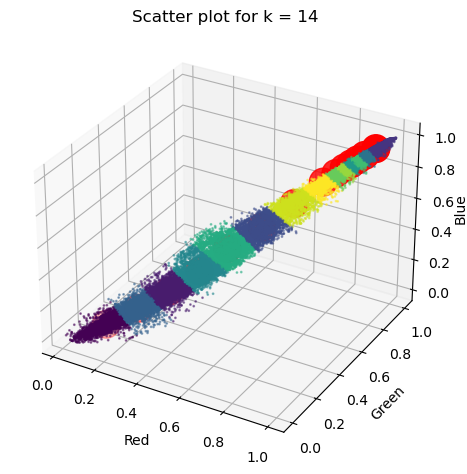

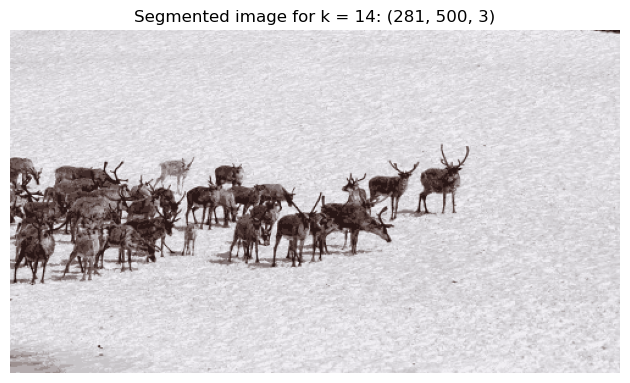


Restored color values of the 15 centers:
 [[153.09158416 140.76980198 140.23366337]
 [232.90327203 230.87341772 235.26146406]
 [ 38.48055655  21.7916518   21.08811987]
 [241.14989812 239.16518085 243.67880795]
 [197.97459645 193.87218841 196.74596454]
 [108.9872      89.5728      85.81728   ]
 [223.01765776 220.87983867 224.96965226]
 [218.97939289 216.75614111 220.64012355]
 [128.03752345 114.05140713 114.33958724]
 [ 62.61441744  42.86532551  40.62335848]
 [214.21617311 211.9126482  215.83848158]
 [176.78986272 168.61298838 169.84635692]
 [227.34389751 225.25806762 229.51719488]
 [ 86.03241969  65.39109932  61.90067787]
 [207.96555454 205.37548881 208.93077627]]


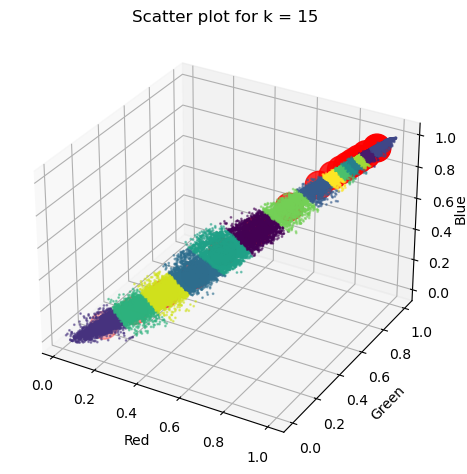

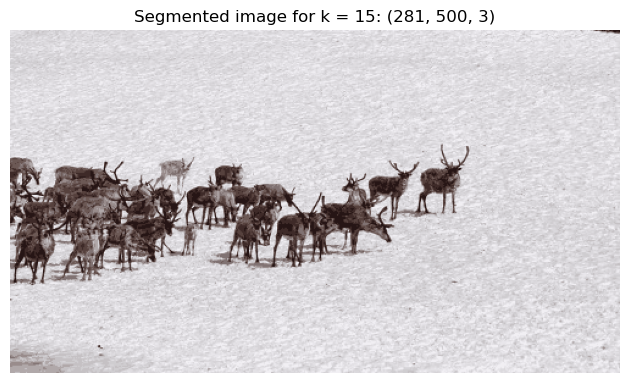

In [20]:
# Reshape the data to a matrix of total_num_pixels x 3
reindeer_img = plt.imread(".\\data\\reindeer.jpg")
print("Shape of original image: ", reindeer_img.shape)

num_pixels = reindeer_img.shape[0] * reindeer_img.shape[1]
r_data = np.reshape(reindeer_img, (num_pixels, 3)) /255. # flattens the image and rescales value of each pixel

# Print the shape of the data and the min and max values of the pixels
print("Shape of data: ", r_data.shape)
print("Minimum pixel value: ", np.min(r_data))
print("Maximum pixel value: ", np.max(r_data))

# Cycle over different values of K and plot the results for each value
print('\nK-means clustering with different values of K (2-15):')
inertia = list()
for k in range(2,16):
    # Define the K-means model
    kmeans = KMeans(n_clusters=k, init='random', n_init='auto', max_iter=100,)

    # Fit the model to the data
    kmeans.fit(r_data)

    # Get the cluster centers
    r_centers = kmeans.cluster_centers_

    # Extract the color values of the centers
    r_colors = r_centers * 255.
    print(f"\nRestored color values of the {k} centers:\n", r_colors)

    # Reshape the data to the original image shape
    r_labels = kmeans.labels_
    r_segmented_image = r_centers[r_labels].reshape(reindeer_img.shape)

    # Update the inertia
    current_inertia = kmeans.inertia_
    inertia.append(current_inertia)
    
    # Plot the scatter plot and the recolored image
    scatter_plot(r_data, r_labels, r_centers, f'Scatter plot for k = {k}')

    # Plot the recolored image
    img_plot(r_segmented_image, f'Segmented image for k = {k}')

k = 2        error = 1979.5874911862138
k = 3        error = 1104.345741001387
k = 4        error = 715.8390598242081
k = 5        error = 490.79140241489216
k = 6        error = 380.2801967817836
k = 7        error = 285.5173528030704
k = 8        error = 239.94051370662433
k = 9        error = 192.88189709001676
k = 10        error = 169.2529129192214
k = 11        error = 144.40148736316343
k = 12        error = 131.09522718253396
k = 13        error = 120.59679925082028
k = 14        error = 104.92478038881491
k = 15        error = 98.38892170200124


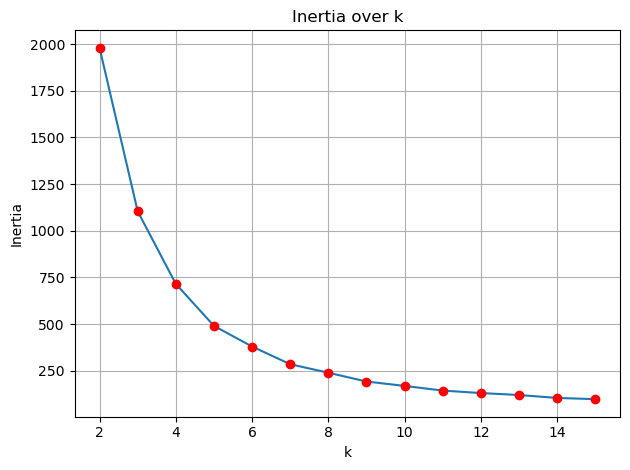

In [21]:
for k in range(2,16):
    print(f"k = {k}" ,"      ", "error =", inertia[k-2])

inertia_plot(inertia, labels=range(2,16,1))

## B) Linkage-based clustering

The second part of the assignment concern instead linkage-based clustering. We will use the AgglomerativeClustering module of sklearn. 

### TO DO (B.0)

Load the sample dataset located at `data/moon_data.npz`

In [22]:
# Load sample data
data = np.load("C:\\Users\\alepa\\OneDrive\\Desktop\\data\\moon_data.npz") # (use np.load())

# Extract data
x = data['X']
labels_true = data['labels_true']

### TO DO (B.1)

Now exploit the AgglomerativeClustering algorithm from sklearn on the provided sample data points. Use the "single" linkage type that correspond to the minimum distance criteria seen in the lectures and 2 clusters. Notice that the "single" option has been introduced recently in sklearn, if you get an error ensure you have a recent version of the library. Plot the resulting clustering.

In [23]:
# Compute Agglomerative Clustering
# Define the Agglomerative Clustering model
aggcl = AgglomerativeClustering(n_clusters=2,linkage='single')

# Fit the model to the data
aggcl.fit(x)

# Compute the number of clusters in labels, ignoring noise if present.
labels = aggcl.labels_ # array containing the cluster assignment for each point
if -1 in aggcl.labels_: # checks if label -1 is present.
    # Label -1 is typically used to represent noise in clustering algorithms
    n_clusters = len(np.unique(aggcl.labels_)) -1 # if -1 is present, subtracts 1 from the count of clusters
else: # else, the number of clusters is simply the lenght of this array
    n_clusters = len(np.unique(aggcl.labels_)) # where np.unique returns only the unique labels 

# Print the results
print(f"Number of clusters = {n_clusters}")
print(f"Labels: {labels}")

Number of clusters = 2
Labels: [1 0 1 ... 1 0 1]


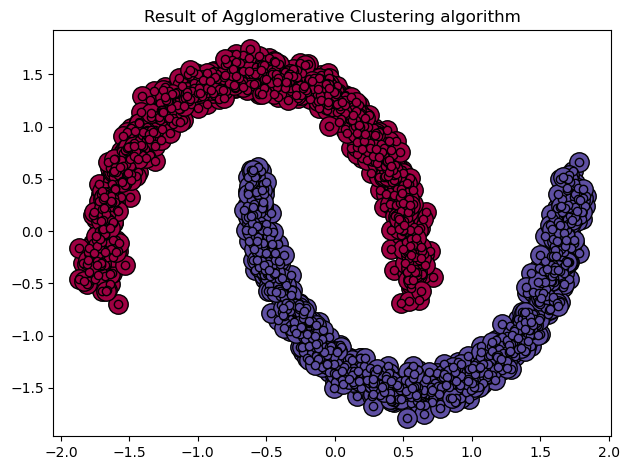

In [24]:
# Plot result 
# Suggestion: use the function cluster_plot()
cluster_plot(labels, x, 'Result of Agglomerative Clustering algorithm')

### TO DO (B.2)

Now try the KMeans with two clusters on the same dataset we used for the AgglomerativeClustering algorithm.

C:\Users\alepa\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(


Colors of the centers:
 [[-190.05115641  201.56522494]
 [ 188.03469852 -199.42660186]]


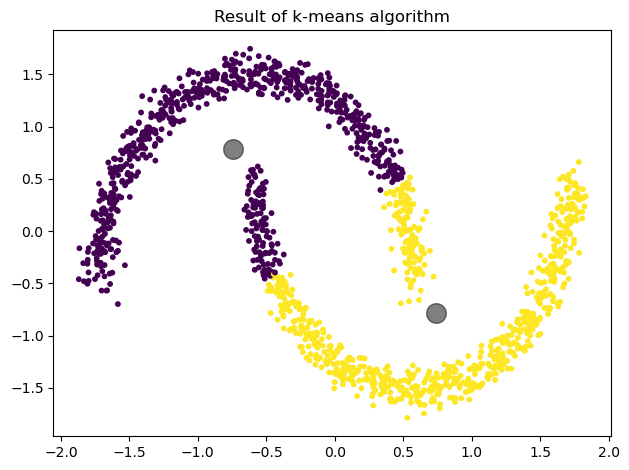

In [25]:
# Define the K-means model
kmeans = KMeans(n_clusters=2, init='random', n_init='auto', max_iter=100)

# Fit the model to the data
kmeans.fit(x)

# Get the cluster centers
centers = kmeans.cluster_centers_

# Extract the color values of the centers
colors = centers*255
print("Colors of the centers:\n", colors)

# Plot the results
# Suggestion: use the function scatter_plot_2d()
scatter_plot_2d(x, kmeans.labels_ ,centers, 'Result of k-means algorithm')

### TO DO (B.Q1)

**QUESTION B.Q1**: Compare the results of K-means and Agglomerative Clustering and explain what you observe and why?

**ANSWER B.Q1:** It is immediate to notice that in this case the k-means algorithm fails to correctly predict the dataset.

This is because the k-means algorithm is enforcing (hyper-)spherically symmetric clusters in the n-dimensional space of data. However, the dataset can be distributed in several different ways and can significantly deviate from (hyper-)spherical symmetry: this can lead to misinterpretation and mislabelling of the dataset as in this case.

Instead, agglomerative clustering starts from the trivial situation in which each single point is a cluster and goes on repeatedly merging the closest clusters together. This makes the algorithm more efficient because less dependent on the data distribution, and applicable to a larger variety of datasets with in general better results.

---